In [2]:
#imports

from PIL import Image
import os
from pathlib import Path
import argparse
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import classification_report


In [ ]:
from onegcop import WT3Net,WaterLevelDataset,ToTensor

DEPLOY_INPUT_DIR='deploy/split1test'
DEPLOY_OUTPUT_DIR='deploy/split1out'
MODEL_PATH = 'data/exps/default_exp/model.pt'

os.makedirs(DEPLOY_OUTPUT_DIR,exist_ok=True)

filenames = [os.path.join(DEPLOY_INPUT_DIR,_) for _ in os.listdir(DEPLOY_INPUT_DIR)
           if os.path.isfile(os.path.join(DEPLOY_INPUT_DIR,_)) and _.endswith('.jpg')]

d_imgs,d_ann_imgs = [],[]
for f_ in filenames:
  original = Image.open(f_)
  original = np.asarray(original)
  original = original[:,:,:3]
  
  # Dummy annotation mask, to ensure we only need one Dataset class.
  annotation_mask = np.zeros(original.shape[:2])

  d_imgs.append(original)
  d_ann_imgs.append(annotation_mask)

model = WT3Net(num_channels = 10, filter_size = 5)

# Load the state_dict and filter out unexpected keys
state_dict = torch.load(MODEL_PATH)
filtered_state_dict = {k: v for k, v in state_dict.items() if k in model.state_dict()}
model.load_state_dict(filtered_state_dict, strict=False)

transform = ToTensor()

deploy_dataset = WaterLevelDataset(d_imgs,d_ann_imgs,transform = transform)

T = 1e-1
for idx in range(deploy_dataset.__len__()):
  dta = deploy_dataset[idx]
  inputs = dta['input'].unsqueeze(0)  # Add batch dimension
  targets = dta['target']

  img = inputs.squeeze(0).cpu().detach().numpy().transpose((1, 2, 0))  # Adjust dimension
  outp = F.softmax((model(inputs)/T),dim = 1).cpu().detach().numpy().squeeze(0)  # Adjust dimension

  img[:,:,0] += outp.squeeze(0)  # Remove batch dimension
  img[:,:,0] = img[:,:,0]/img[:,:,0].max()
  base_filename = os.path.basename(filenames[idx])
  print(f'Filename : {filenames[idx]}')
  plt.imshow(img)
  plt.show()
  plt.imsave(os.path.join(DEPLOY_OUTPUT_DIR,f'out_{base_filename}'),img)

  outp = F.softmax(model(inputs),dim = 0).cpu().detach().numpy().squeeze()  # Squeeze to remove extra dimensions
  plt.imsave(os.path.join(DEPLOY_OUTPUT_DIR,f'out_gray_{base_filename}'),outp,cmap='gray')
  plt.imshow(outp,cmap='gray')
  plt.show()

In [7]:
from one_g import WT3Net,WaterLevelDataset,ToTensor

DEPLOY_INPUT_DIR='deploy/split1test'
DEPLOY_OUTPUT_DIR='deploy/split1out'
MODEL_PATH = 'data/exps/default_config_epoch_200/model.pt'

os.makedirs(DEPLOY_OUTPUT_DIR,exist_ok=True)

filenames = [os.path.join(DEPLOY_INPUT_DIR,_) for _ in os.listdir(DEPLOY_INPUT_DIR)
           if os.path.isfile(os.path.join(DEPLOY_INPUT_DIR,_)) and _.endswith('.jpg')]

d_imgs,d_ann_imgs = [],[]
for f_ in filenames:
  original = Image.open(f_)
  original = np.asarray(original)
  original = original[:,:,:3]
  
  # Dummy annotation mask, to ensure we only need one Dataset class.
  annotation_mask = np.zeros(original.shape[:2])

  d_imgs.append(original)
  d_ann_imgs.append(annotation_mask)

model = WT3Net(num_channels = 10, filter_size = 5)

# Load the state_dict and filter out unexpected keys
state_dict = torch.load(MODEL_PATH)
filtered_state_dict = {k: v for k, v in state_dict.items() if k in model.state_dict()}
model.load_state_dict(filtered_state_dict, strict=False)

transform = ToTensor()

deploy_dataset = WaterLevelDataset(d_imgs,d_ann_imgs,transform = transform)

T = 1e-1
for idx in range(deploy_dataset.__len__()):
  dta = deploy_dataset[idx]
  inputs = dta['input'] 
  targets = dta['target']

  img = inputs.cpu().detach().numpy().transpose((1,2,0))
  outp = F.softmax((model(inputs)/T),dim = 0).cpu().detach().numpy()


  img[:,:,0] +=outp
  img[:,:,0] = img[:,:,0]/img[:,:,0].max()
  base_filename = os.path.basename(filenames[idx])
  print(f'Filename : {filenames[idx]}')
  plt.imshow(img)
  plt.show()
  plt.imsave(os.path.join(DEPLOY_OUTPUT_DIR,f'out_{base_filename}'),img)

  outp = F.softmax(model(inputs),dim = 0).cpu().detach().numpy()
  plt.imsave(os.path.join(DEPLOY_OUTPUT_DIR,f'out_gray_{base_filename}'),outp,cmap='gray')
  plt.imshow(outp,cmap='gray')
  plt.show()



/var/folders/s9/7x6wjtq126773lhfsl5rqqv40000gn/T/ipykernel_74866/3648206932.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(MODEL_PATH)


RuntimeError: Error(s) in loading state_dict for WT3Net:
	size mismatch for conv1.weight: copying a param with shape torch.Size([10, 3, 7, 7]) from checkpoint, the shape in current model is torch.Size([10, 3, 5, 5]).
	size mismatch for conv2.weight: copying a param with shape torch.Size([10, 10, 7, 7]) from checkpoint, the shape in current model is torch.Size([10, 10, 5, 5]).

/var/folders/s9/7x6wjtq126773lhfsl5rqqv40000gn/T/ipykernel_74866/818360448.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(MODEL_PATH))

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame042.jpg


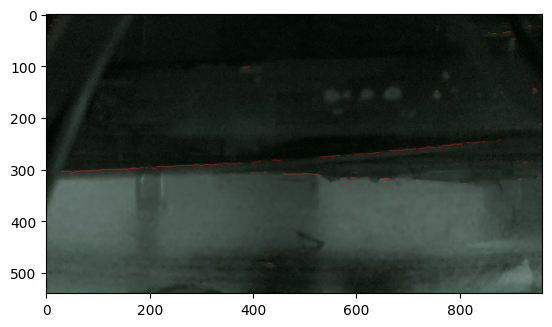

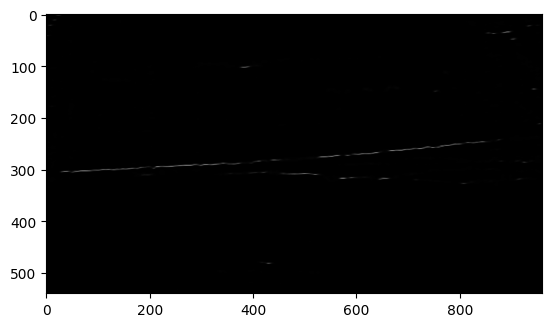

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame043.jpg


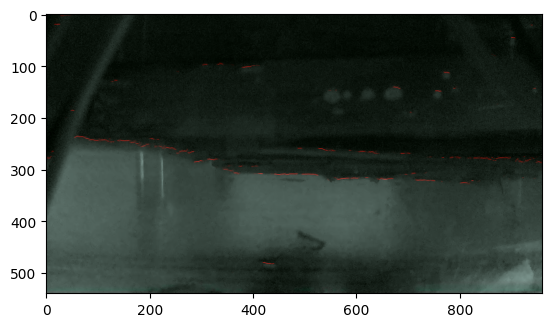

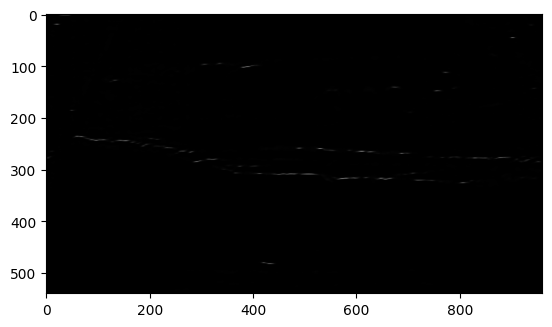

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame041.jpg


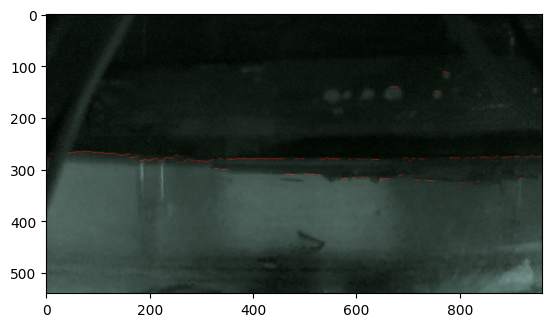

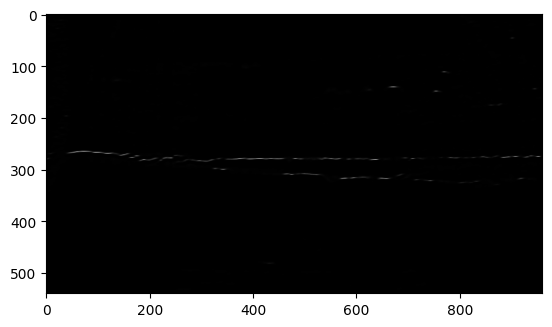

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame040.jpg


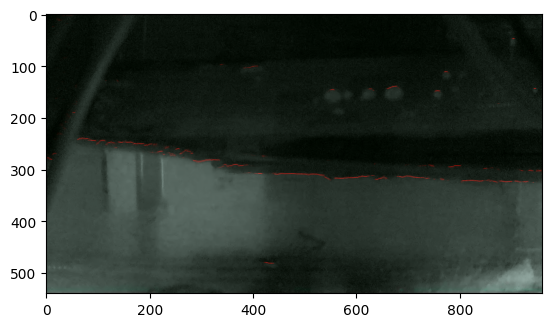

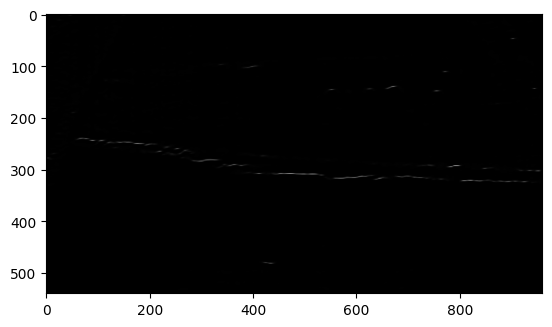

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame044.jpg


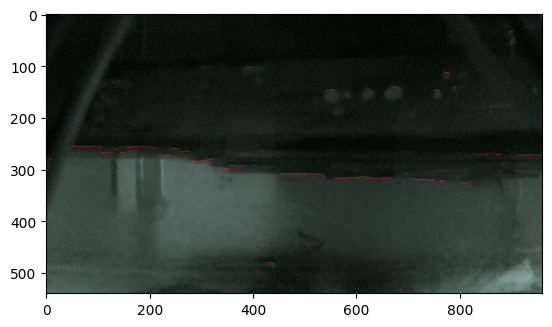

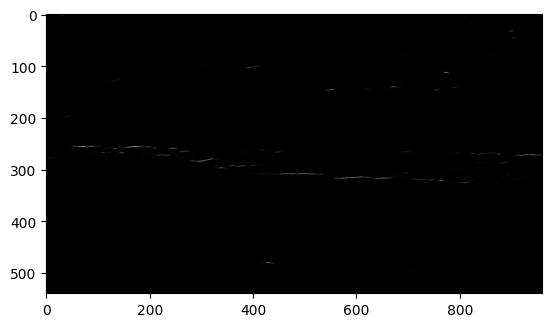

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame045.jpg


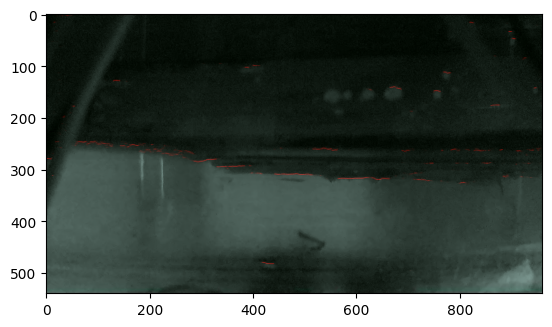

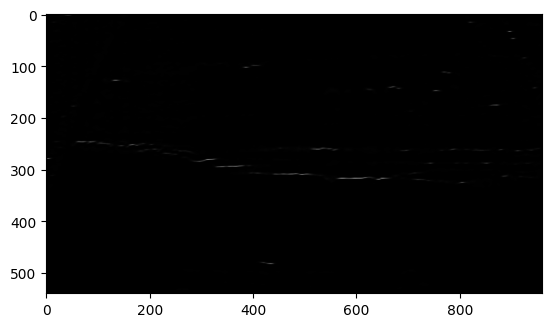

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame009.jpg


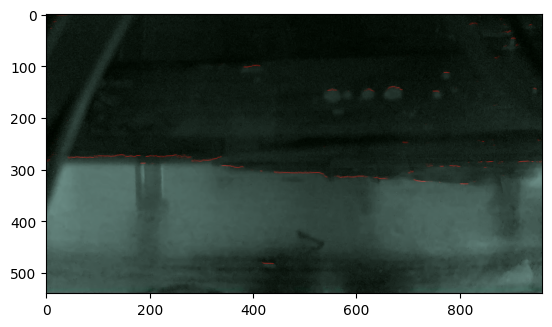

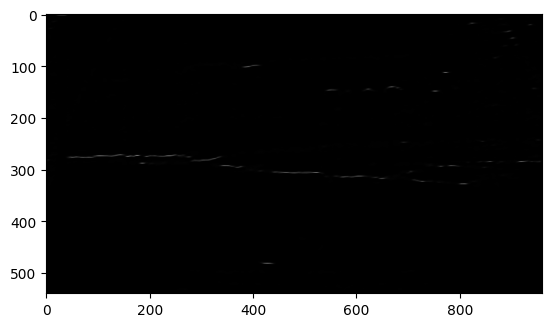

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame035.jpg


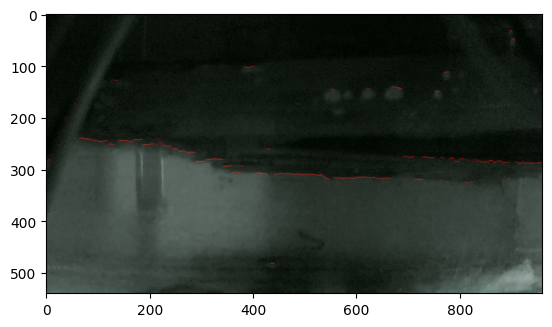

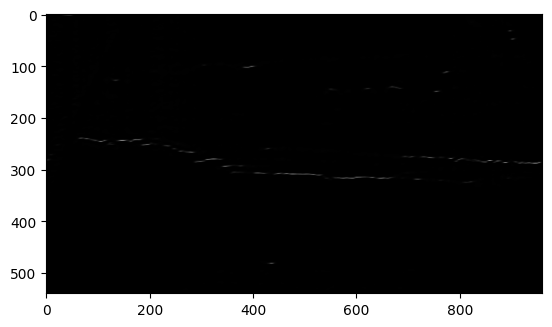

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame021.jpg


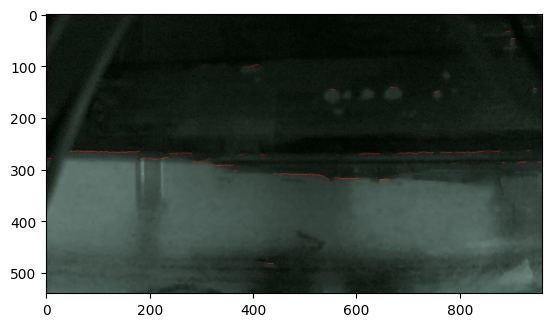

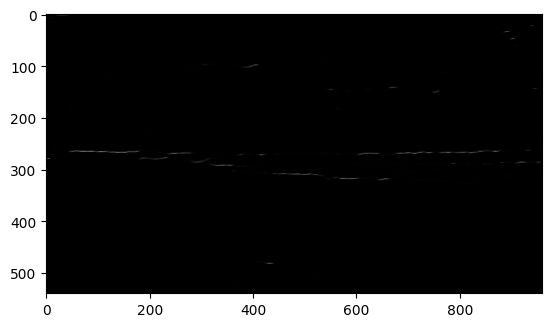

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame020.jpg


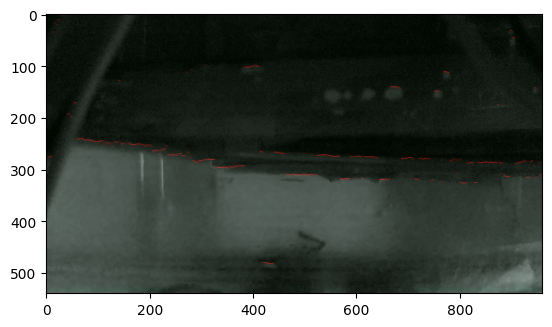

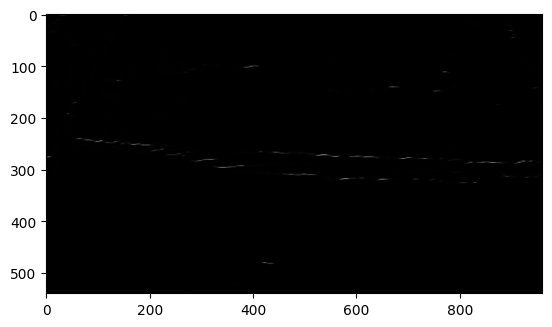

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame034.jpg


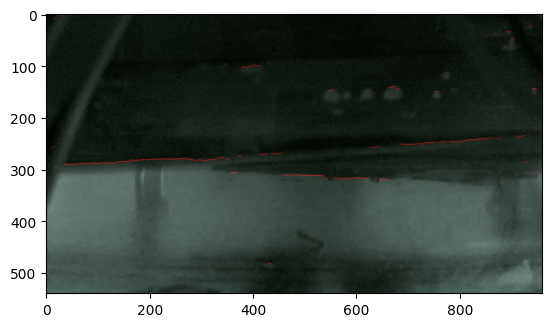

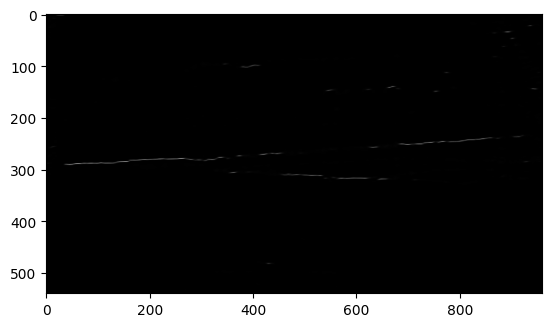

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame008.jpg


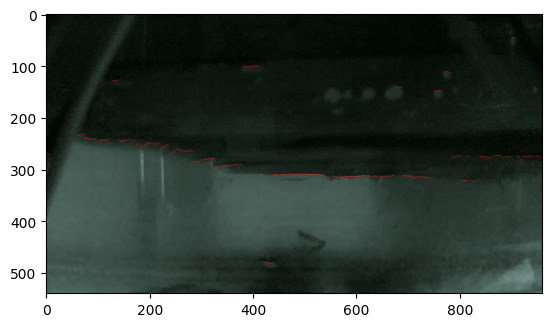

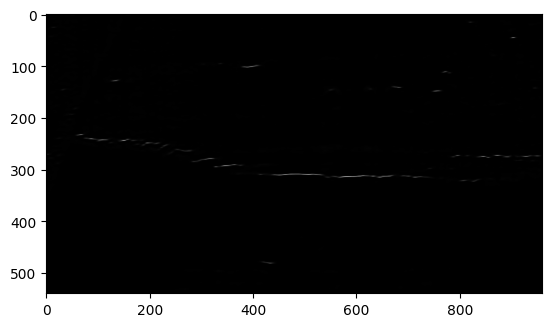

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame022.jpg


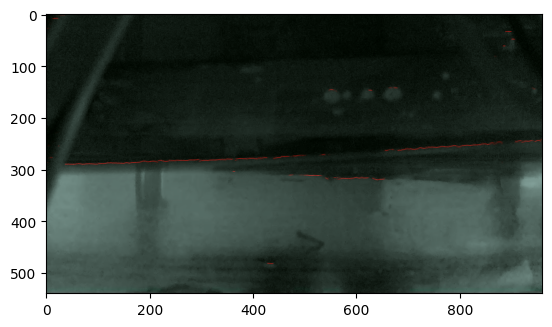

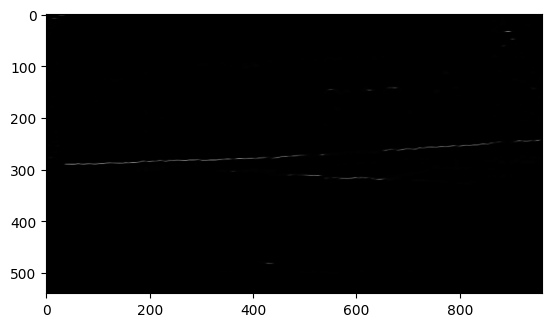

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame036.jpg


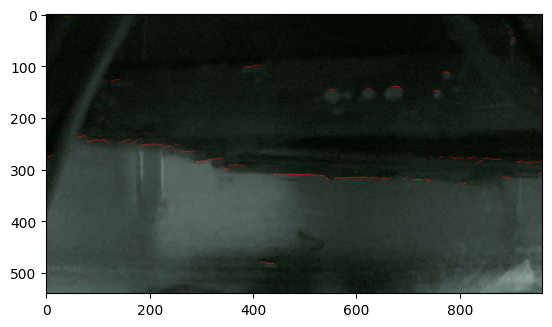

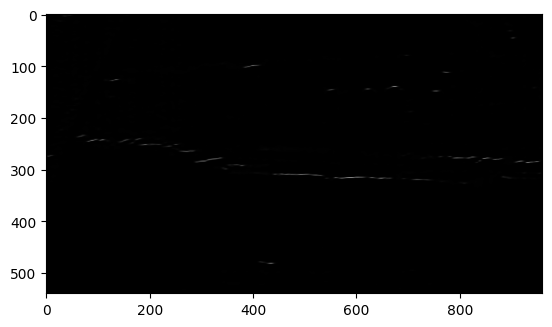

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame037.jpg


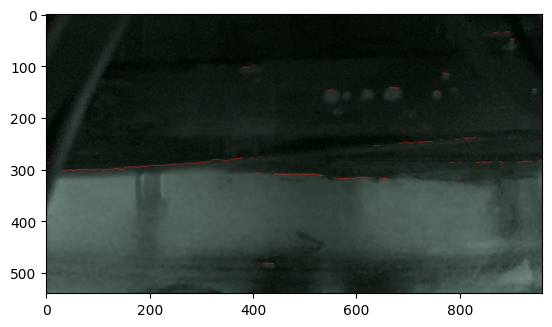

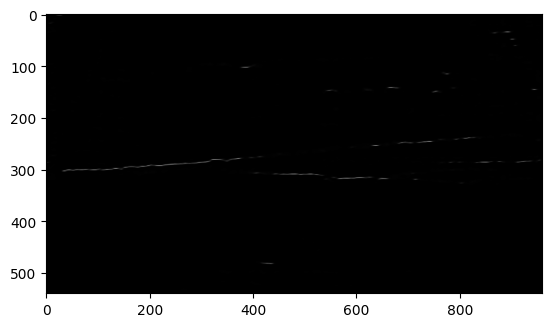

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame023.jpg


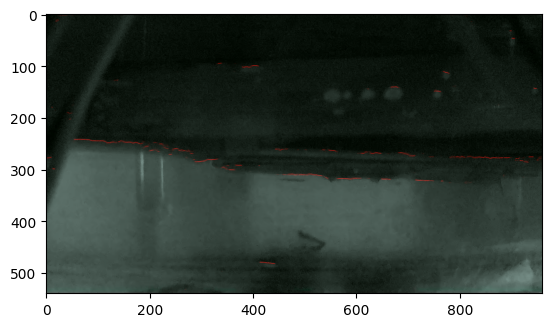

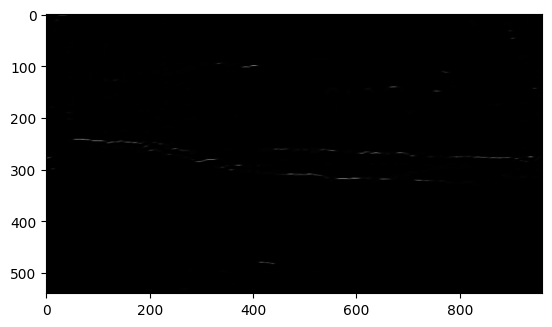

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame027.jpg


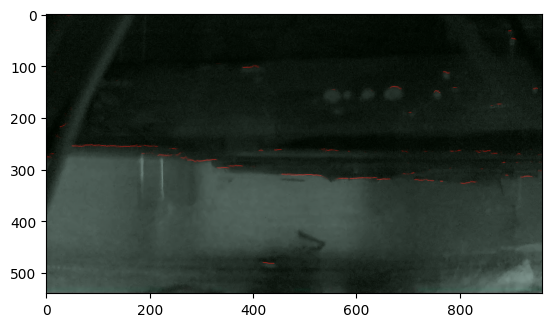

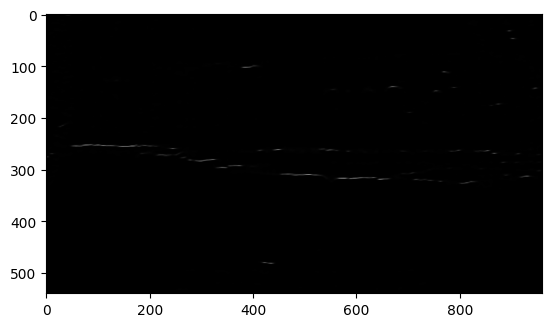

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame033.jpg


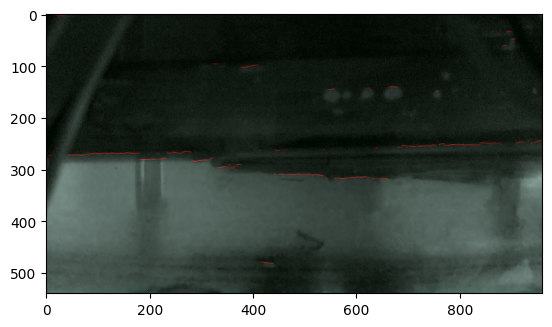

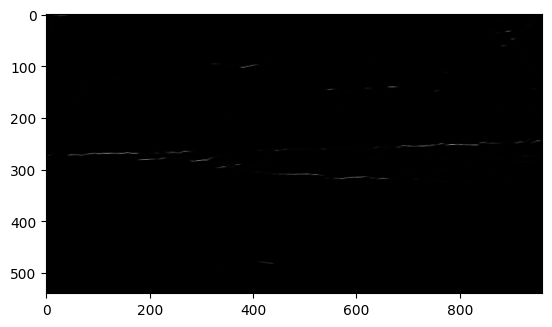

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame032.jpg


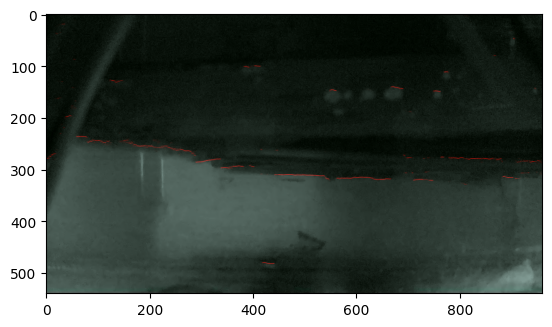

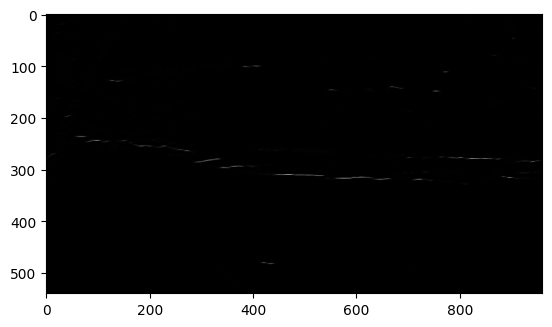

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame026.jpg


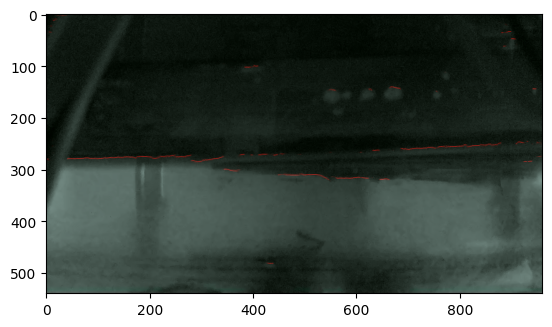

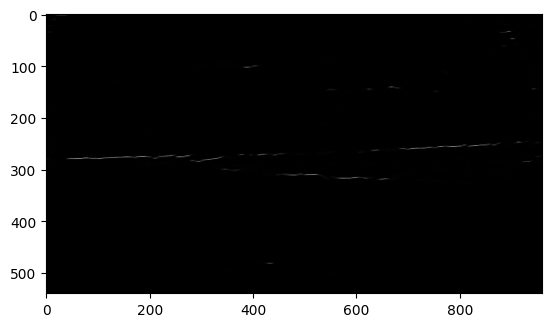

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame030.jpg


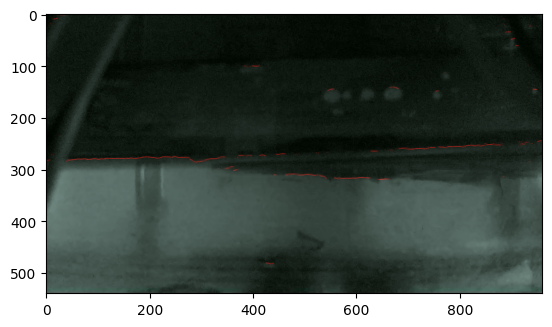

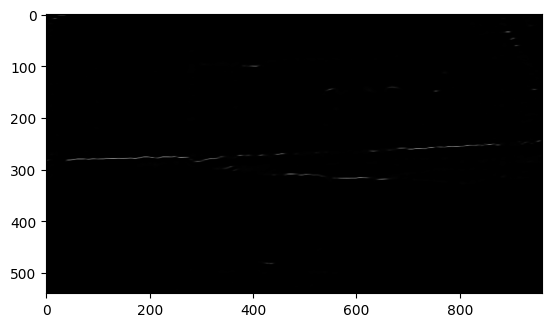

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame024.jpg


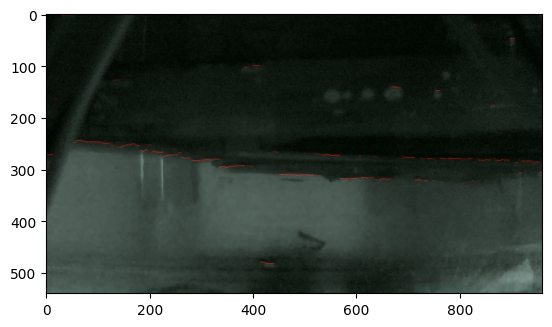

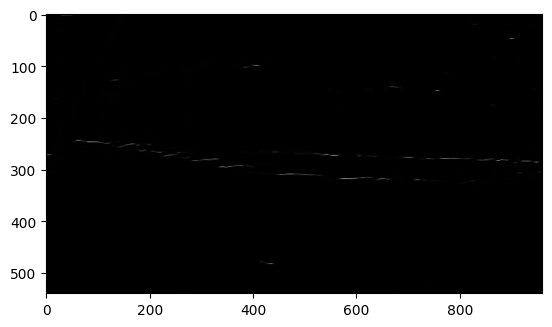

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame018.jpg


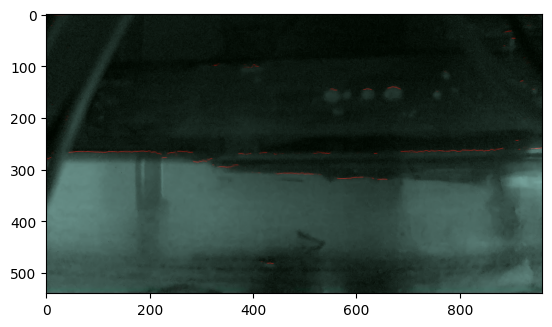

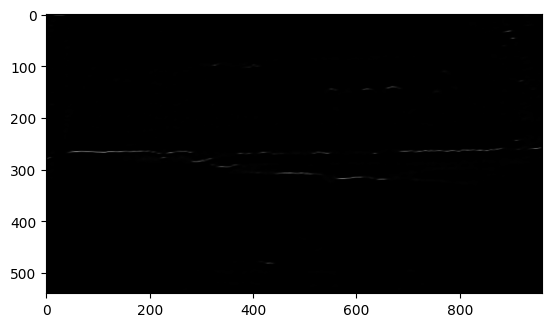

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame019.jpg


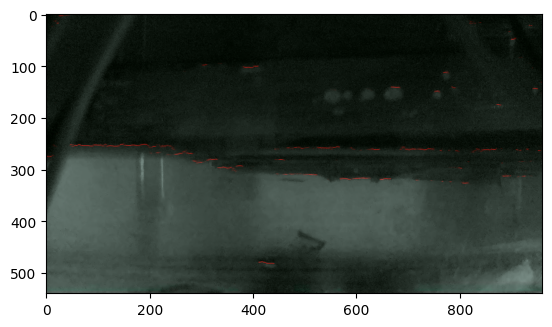

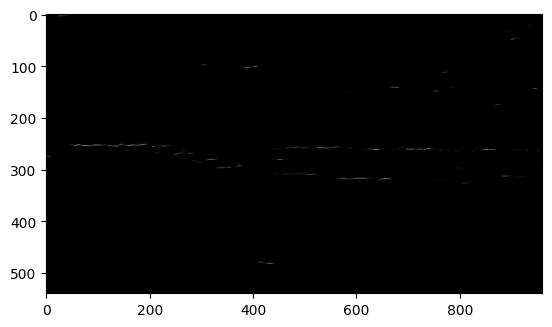

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame025.jpg


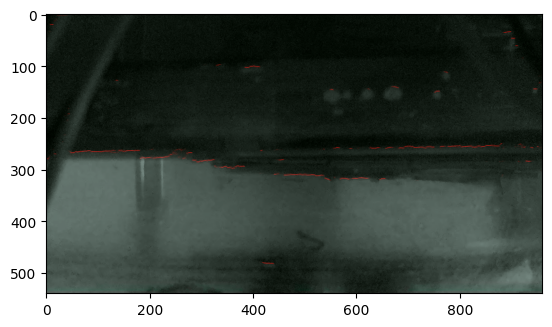

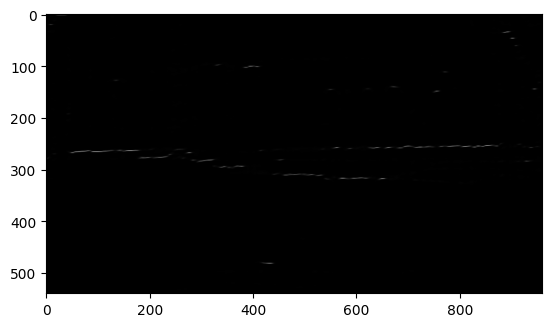

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame031.jpg


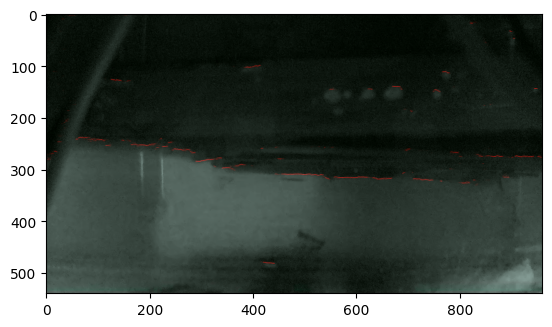

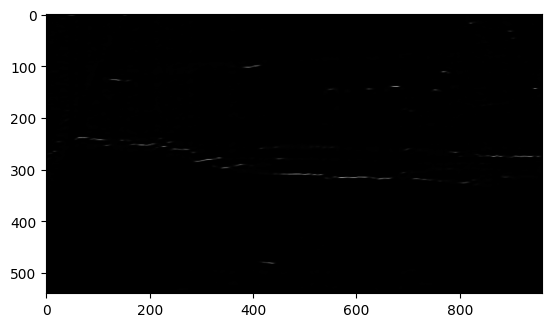

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame028.jpg


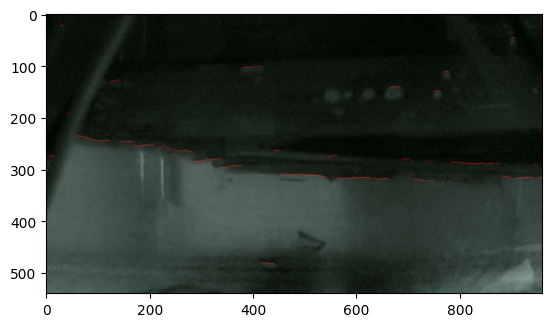

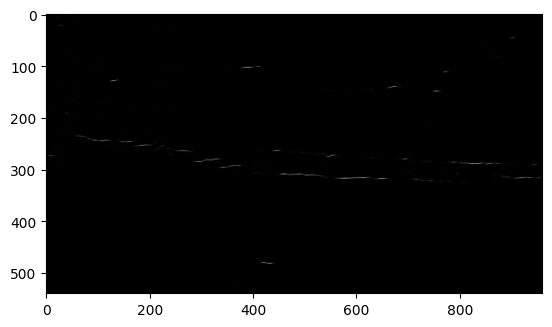

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame014.jpg


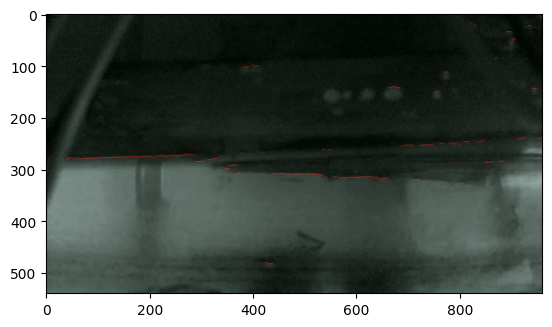

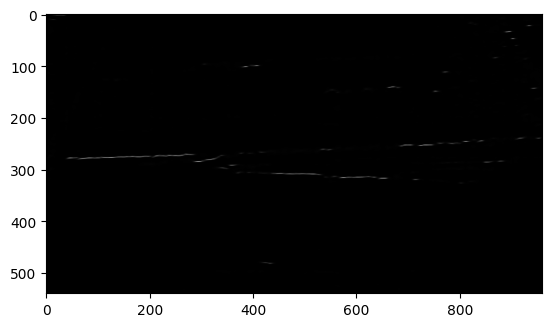

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame001.jpg


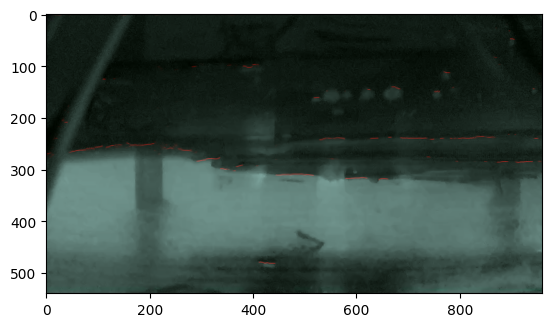

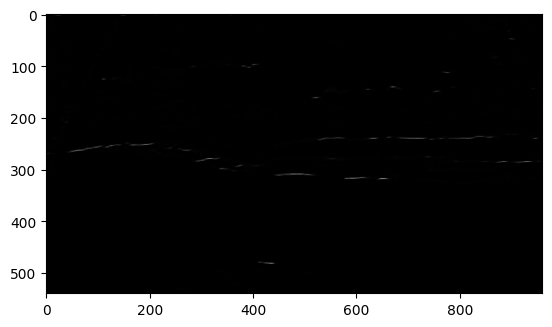

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame015.jpg


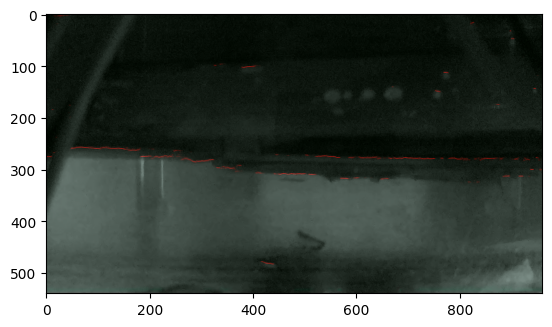

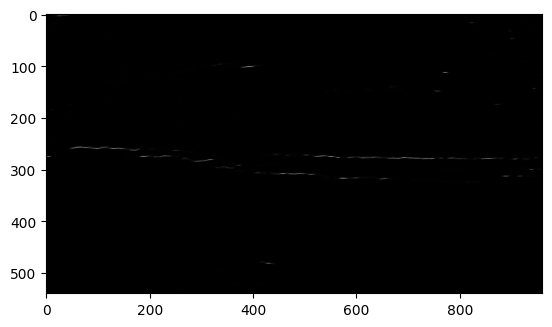

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame029.jpg


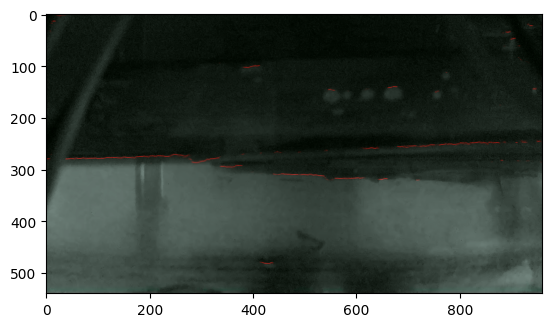

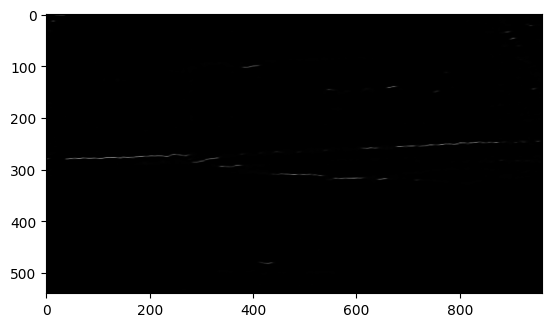

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame003.jpg


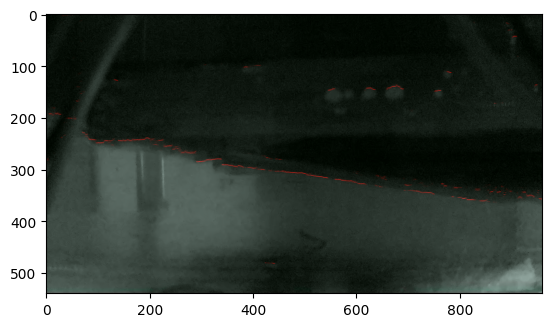

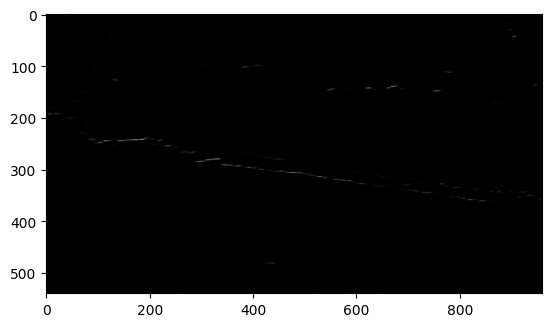

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame017.jpg


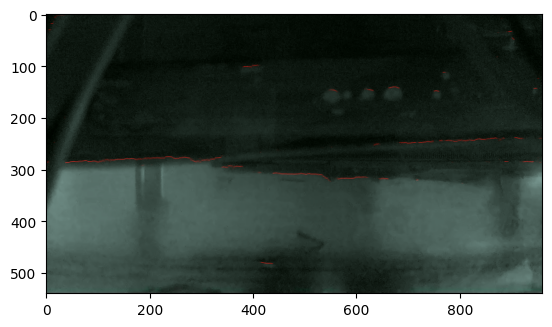

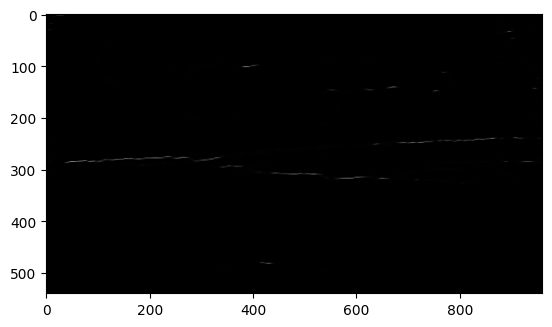

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame016.jpg


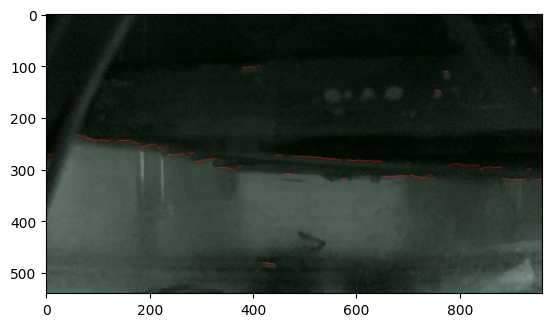

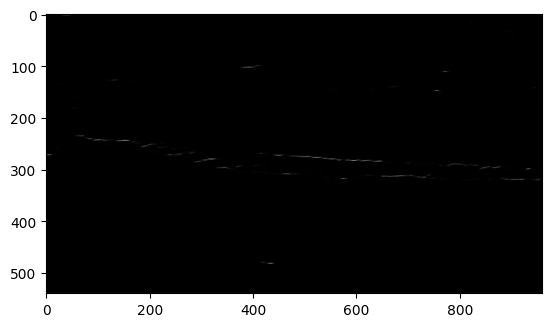

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame002.jpg


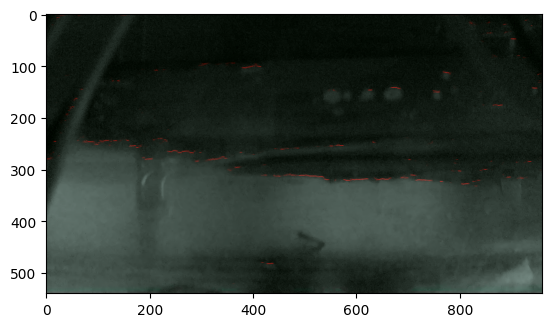

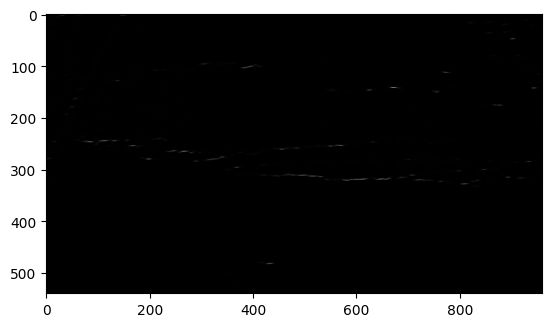

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame006.jpg


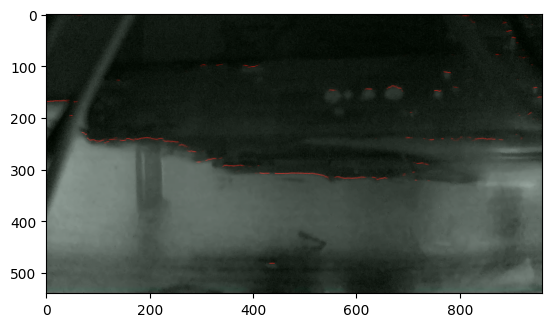

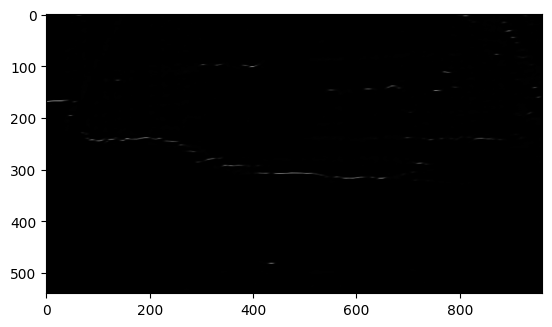

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame012.jpg


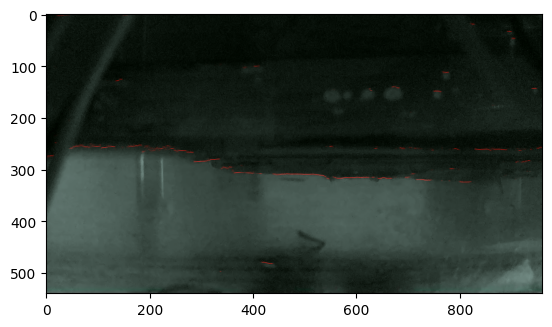

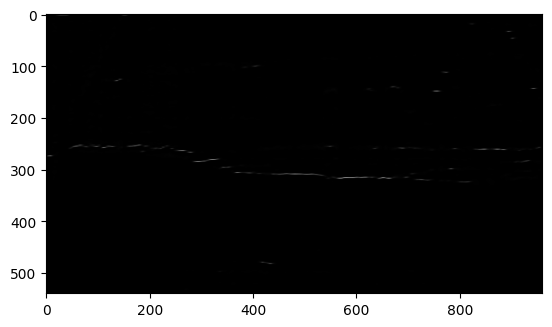

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame013.jpg


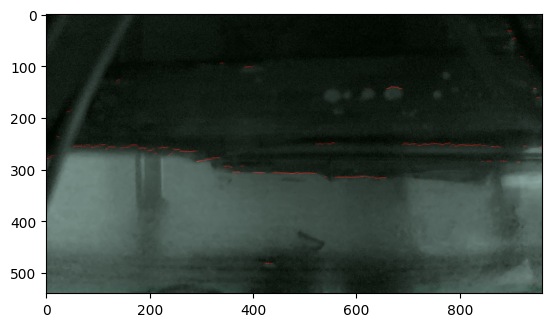

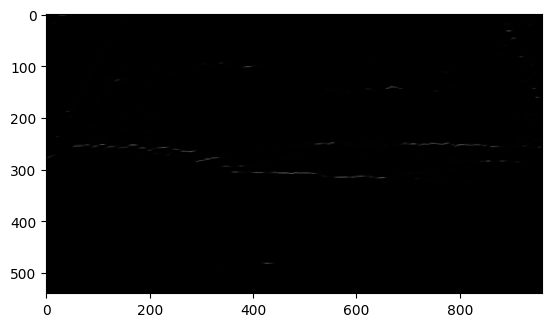

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame007.jpg


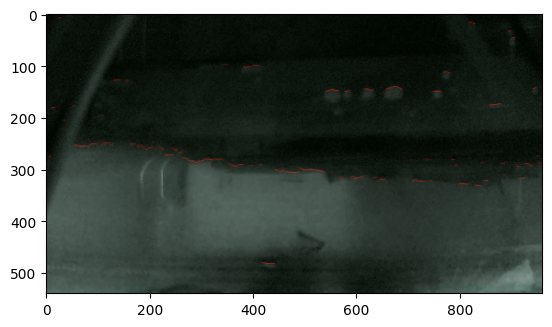

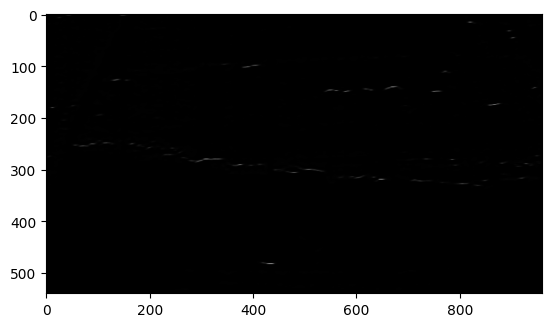

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame011.jpg


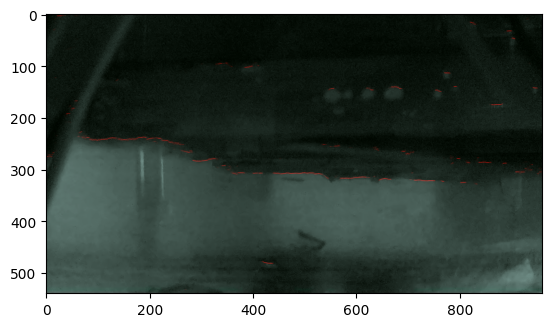

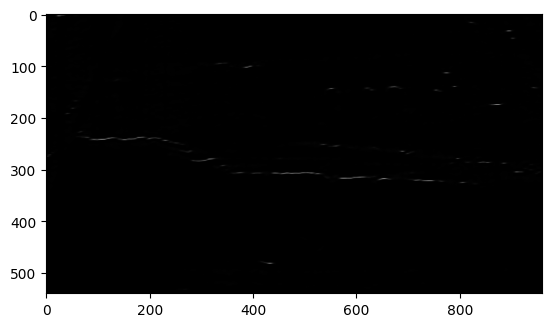

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame005.jpg


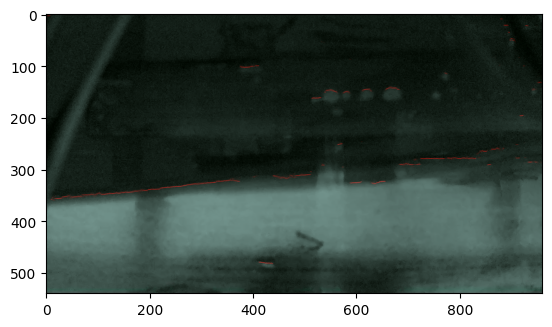

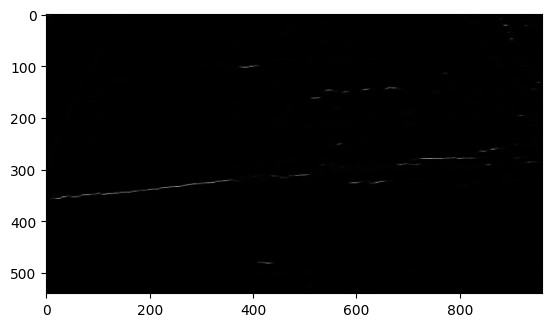

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame039.jpg


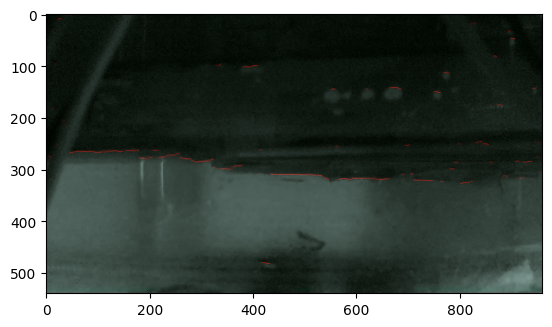

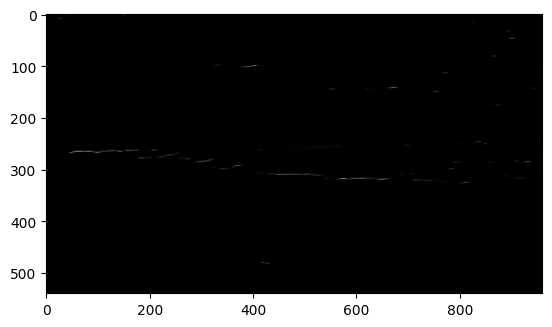

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame038.jpg


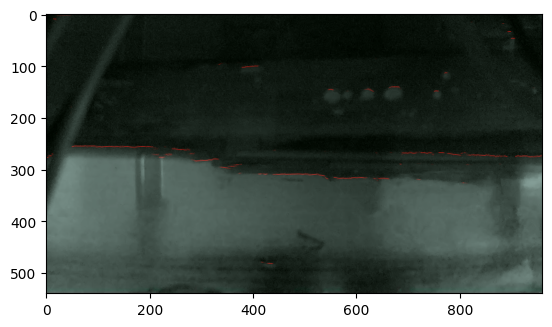

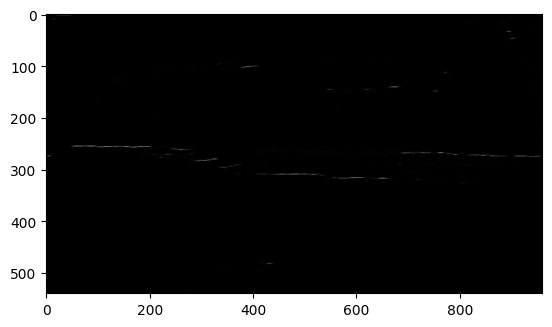

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame004.jpg


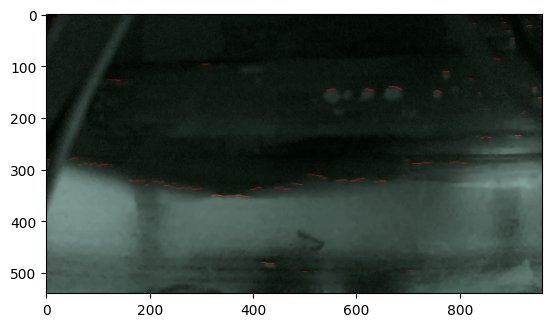

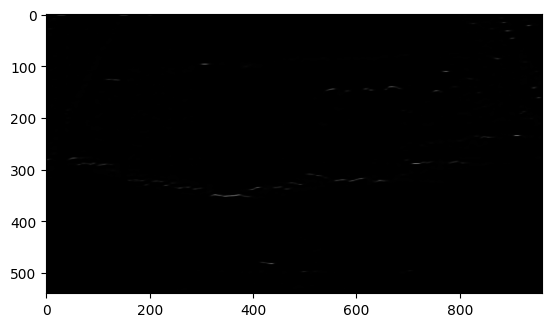

Filename : /Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input/t1frame010.jpg


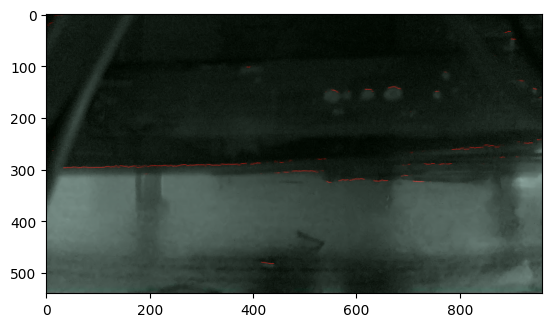

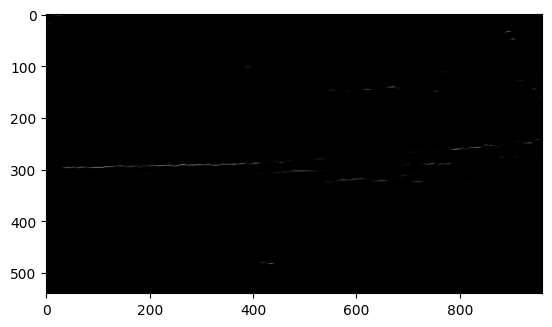

In [26]:
from one_g import WT3Net,WaterLevelDataset,ToTensor

DEPLOY_INPUT_DIR='/Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/input'
DEPLOY_OUTPUT_DIR='/Users/prathamwankhede/Documents/PGSW/amplitude/extraDataT1/output'
MODEL_PATH = 'data/exps/default_config_epoch_200/model.pt' 

os.makedirs(DEPLOY_OUTPUT_DIR,exist_ok=True)

filenames = [os.path.join(DEPLOY_INPUT_DIR,_) for _ in os.listdir(DEPLOY_INPUT_DIR)
           if os.path.isfile(os.path.join(DEPLOY_INPUT_DIR,_)) and _.endswith('.jpg')]

d_imgs,d_ann_imgs = [],[]
for f_ in filenames:
  original = Image.open(f_)
  original = np.asarray(original)
  original = original[:,:,:3]
  
  # Dummy annotation mask, to ensure we only need one Dataset class.
  annotation_mask = np.zeros(original.shape[:2])

  d_imgs.append(original)
  d_ann_imgs.append(annotation_mask)

model = WT3Net(num_channels = 10, filter_size = 7)
model.load_state_dict(torch.load(MODEL_PATH))

transform = ToTensor()


deploy_dataset = WaterLevelDataset(d_imgs,d_ann_imgs,transform = transform)

T = 1e-1
for idx in range(deploy_dataset.__len__()):
  dta = deploy_dataset[idx]
  inputs = dta['input'] 
  targets = dta['target']

  img = inputs.cpu().detach().numpy().transpose((1,2,0))
  outp = F.softmax((model(inputs)/T),dim = 0).cpu().detach().numpy()


  img[:,:,0] +=outp
  img[:,:,0] = img[:,:,0]/img[:,:,0].max()
  base_filename = os.path.basename(filenames[idx])
  print(f'Filename : {filenames[idx]}')
  plt.imshow(img)
  plt.show()
  plt.imsave(os.path.join(DEPLOY_OUTPUT_DIR,f'out_{base_filename}'),img)

  outp = F.softmax(model(inputs),dim = 0).cpu().detach().numpy()
  plt.imsave(os.path.join(DEPLOY_OUTPUT_DIR,f'out_gray_{base_filename}'),outp,cmap='gray')
  plt.imshow(outp,cmap='gray')
  plt.show()

In [25]:
filenames

[]